In [52]:
import pandas as pd
import numpy as np
from pandas_datareader import data as pdr
import datetime

# Graph
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

import random

import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
import matplotlib.pyplot as plt
import seaborn as sns

import yfinance as yfin
yfin.pdr_override()

#import plotly.io as pio
#pio.renderers.default = "browser"
import warnings

In [53]:
pd.set_option('display.float_format', lambda x: f'{x:,.6f}')
plt.rcParams["figure.figsize"] = (10,6)

#sk.set_config(display='diagram')
warnings.filterwarnings("ignore")

## Assignment

- Use the implementation and necessary historical data to build a pairs trading strategy for your portfoli

## Variables

In [54]:
start_date = datetime.datetime(2022, 1, 1)
end_date = datetime.datetime.now()
alpha = 0.05
rolling_window = 30

yfin.pdr_override()

# Function

In [55]:
# Function to fetch stock data
def get_stock_data(ticker, start_date, end_date):
    stock_data = yfin.download(ticker, start=start_date, end=end_date)
    return stock_data['Adj Close']

# Function to calculate and plot rolling covariance
def plot_rolling_covariance_multi(stocks, window, start_date, end_date):
    # Fetch stock data
    data = pd.DataFrame({ticker: get_stock_data(ticker, start_date, end_date) for ticker in stocks})
    
    # Calculate daily returns
    returns = data.pct_change().dropna()
    
    # Calculate rolling covariance matrix
    rolling_cov_matrix = returns.rolling(window=window).cov(pairwise=True).unstack(level=-1)
    
    # Plot rolling covariance
    for pair in rolling_cov_matrix.columns.levels[1]:
        plt.figure(figsize=(12, 8))
        plt.plot(rolling_cov_matrix[pair], label=f'Cov({pair[0]}, {pair[1]})')

        plt.title(f'Rolling Covariance Over Time ({window}-day window)')
        plt.xlabel('Date')
        plt.ylabel('Covariance')
        plt.legend()
        plt.show()

# Portfolio

In [56]:
df = pd.read_csv('https://raw.githubusercontent.com/dsimband/DATA618/main/w11/data/DATA618_Portfolio_Rebalance_v2.csv')
df = df[df['Shares'] > 0]
df['Value'].fillna(0, inplace=True)
df['Class'].fillna('Other', inplace=True)
df.head()

,Unnamed: 0,Ticker,BondName,Morningstar_Category,Class,Sub_Class,Purchase_Date,Price,Shares,Value
0,0,IVV,iShares Core S&P 500 ETF,Large Blend,Economically Sensitive,U.S. Equities,9/11/2023,448.845551,8912,4000
1,1,VONG,Vanguard Russell 1000 Growth ETF,Large Growth,Economically Sensitive,U.S. Equities,9/11/2023,72.287704,41501,3000
2,2,SCHD,Schwab US Dividend Equity ETF™,Large Value,Economically Sensitive,U.S. Equities,9/11/2023,73.121880,41027,3000
3,3,IMCB,iShares Morningstar Mid-Cap ETF,Mid-Cap Blend,Economically Sensitive,U.S. Equities,9/11/2023,62.021500,47619,4000
4,4,VO,Vanguard Mid-Cap ETF,Mid-Cap Blend,Economically Sensitive,U.S. Equities,9/11/2023,216.590347,9234,2000


In [57]:
df.groupby(['Class','Sub_Class'])[['Value']].sum()

Value
Class                   Sub_Class                               
Cash                    Cash                                4183
Economically Sensitive  Emerging Market Equities            4000
                        International Equities              8000
                        Long/Short Equities                 2250
                        Private Equity                      4200
                        Publicly Traded REITs              10800
                        U.S. Equities                      24000
Interest Rate Sensitive U.S. Government Bonds              17000
                        Very-High-Quality Corporate Bonds   6000
                        Very-High-Quality Municipal Bonds   6000

## Historic Values

In [58]:
portfolio_total = df['Value'].sum()
df['port_percent'] = df['Value'] / portfolio_total

In [59]:
ticker_lst = list(df['Ticker'])
ticker_lst.remove('C_A_S_H')
weights = (df['port_percent'].values)

In [60]:
price_df = pdr.get_data_yahoo(ticker_lst, start=start_date, end=end_date)
price_df = price_df[['Adj Close']]
price_df.columns = price_df.columns.get_level_values(1)
price_df['C_A_S_H'] = 1

price_df

[*********************100%%**********************]  39 of 39 completed


,ALTVX,ARKK,BLUEX,BPLSX,DFAR,EXAS,FREL,FSMD,GARIX,GCHDX,...,VBR,VFIUX,VGCAX,VICSX,VIGI,VNQ,VO,VONG,VTEB,C_A_S_H
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-03,10.418339,96.187805,36.750973,13.120587,NaN,81.519997,32.608109,35.156246,18.379999,11.112556,...,173.696243,10.937606,20.757507,23.954151,82.452103,107.587128,246.652008,77.947510,52.507778,1
2022-01-04,10.408667,91.923378,36.625603,13.368981,NaN,80.010002,32.608109,35.469013,18.540001,11.084729,...,175.912247,10.937606,20.738213,23.954151,82.249573,107.456276,246.467056,77.110107,52.507778,1
2022-01-05,10.398992,85.407715,36.312180,13.413339,NaN,75.050003,31.671036,34.696888,18.420000,10.991970,...,172.462982,10.908436,20.699629,23.877096,81.111504,104.381012,240.295685,74.647148,52.440800,1
2022-01-06,10.379644,84.872185,36.294270,13.493179,NaN,74.599998,31.689972,34.912884,18.469999,10.973418,...,173.879303,10.879270,20.661049,23.809675,80.542465,104.474487,240.908920,74.489525,52.383400,1
2022-01-07,10.369972,83.721771,36.348000,13.510921,NaN,75.660004,31.491199,34.687111,18.389999,10.945590,...,173.368668,10.859825,20.622465,23.751884,80.638908,103.782799,239.468262,73.671822,52.259018,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-06,9.190000,39.770000,34.070000,15.160000,19.820000,65.199997,22.990000,31.980000,19.620001,10.890000,...,158.139999,9.590000,18.070000,20.430000,72.339996,76.470001,206.210007,70.830002,48.209999,1
2023-11-07,9.210000,40.910000,34.189999,15.070000,19.620001,65.300003,22.790001,31.790001,19.650000,10.920000,...,157.259995,9.620000,18.139999,20.520000,72.110001,75.839996,206.589996,71.489998,48.470001,1
2023-11-08,9.260000,40.340000,34.250000,15.060000,19.730000,62.840000,22.870001,31.680000,19.690001,10.960000,...,156.419998,9.640000,18.200001,20.580000,72.099998,76.089996,206.160004,71.790001,48.650002,1


In [61]:
rolling_window

30

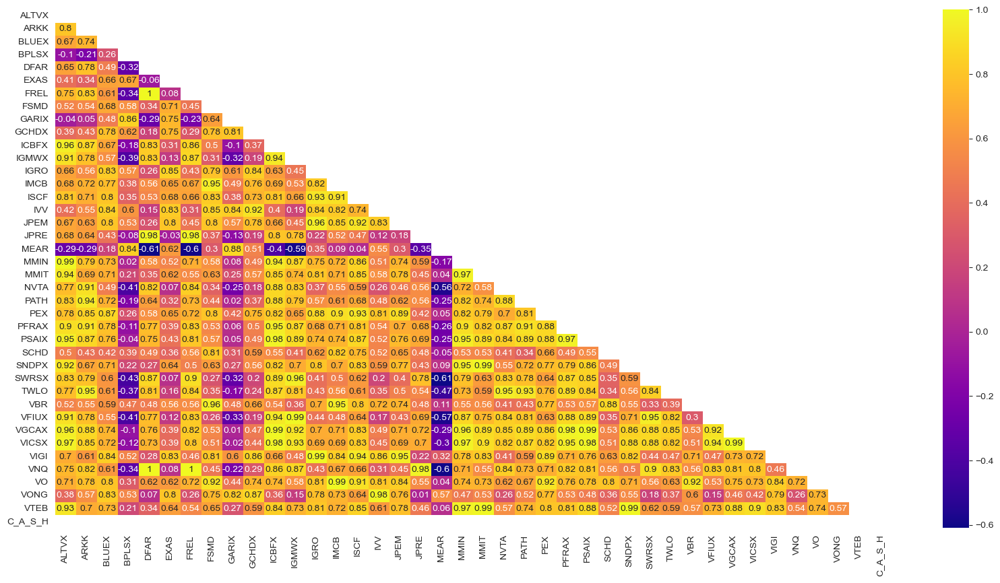

In [62]:
plt.figure(figsize=(20,10))
mask = np.zeros_like(price_df.corr())
mask[np.triu_indices_from(mask)] = True
sns.set_style("white")
_p = sns.heatmap(price_df.corr().round(2), 
                 annot=True, mask=mask, 
                 cmap="plasma", annot_kws={"size": 10})

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

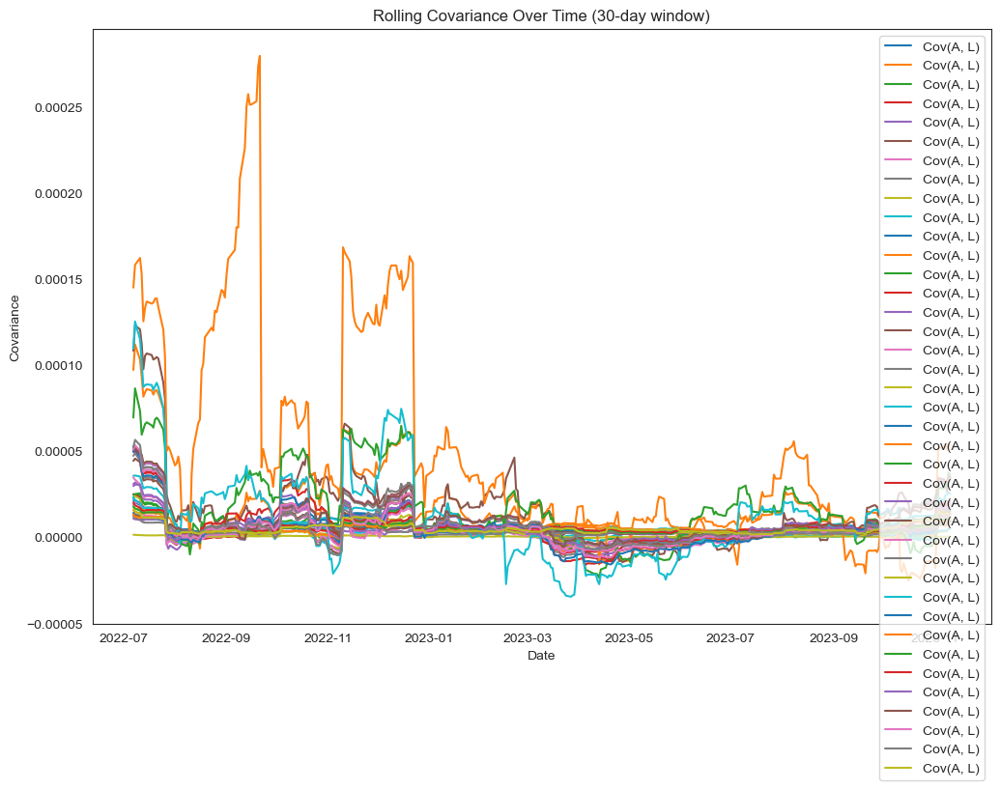

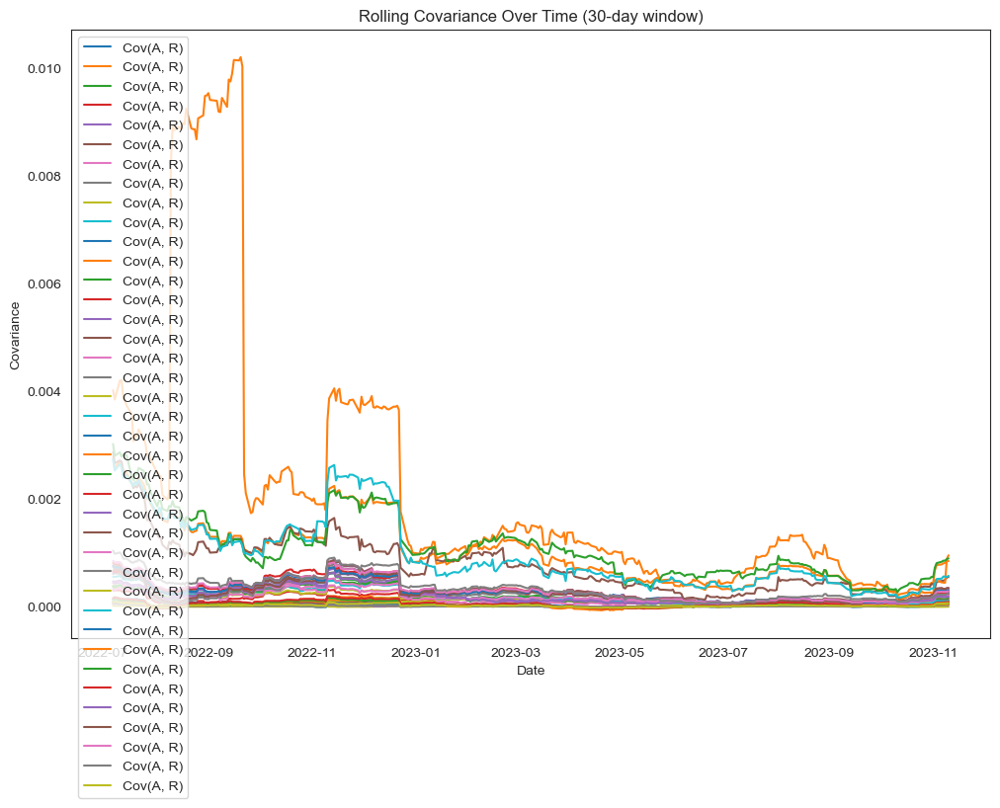

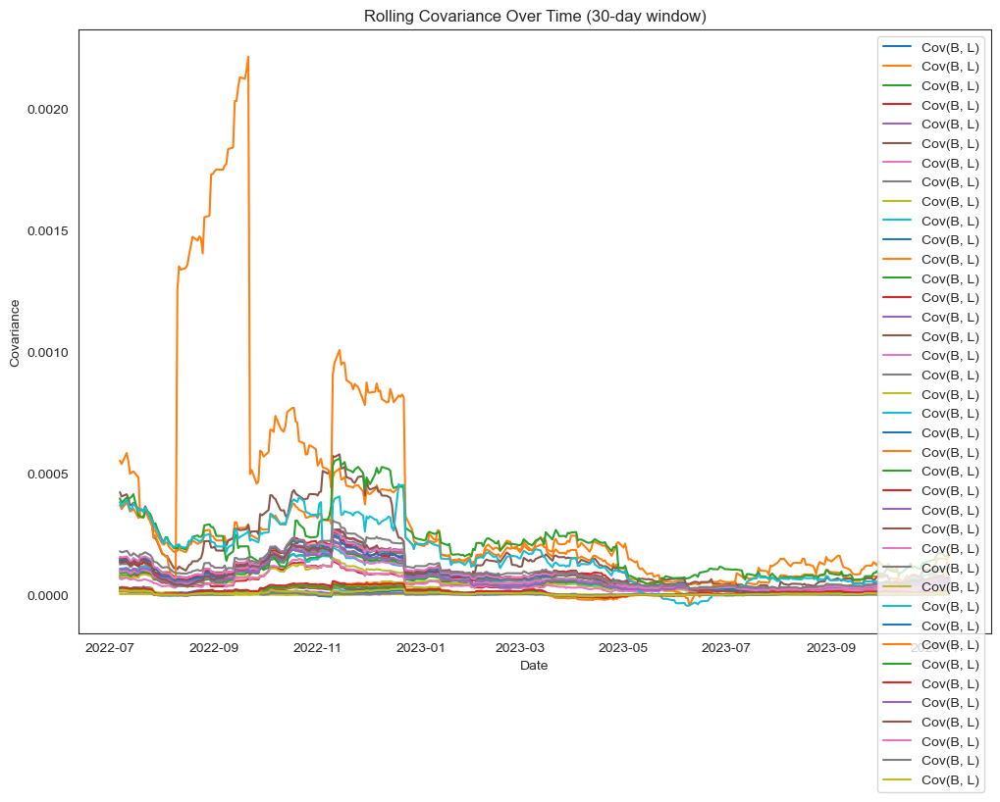

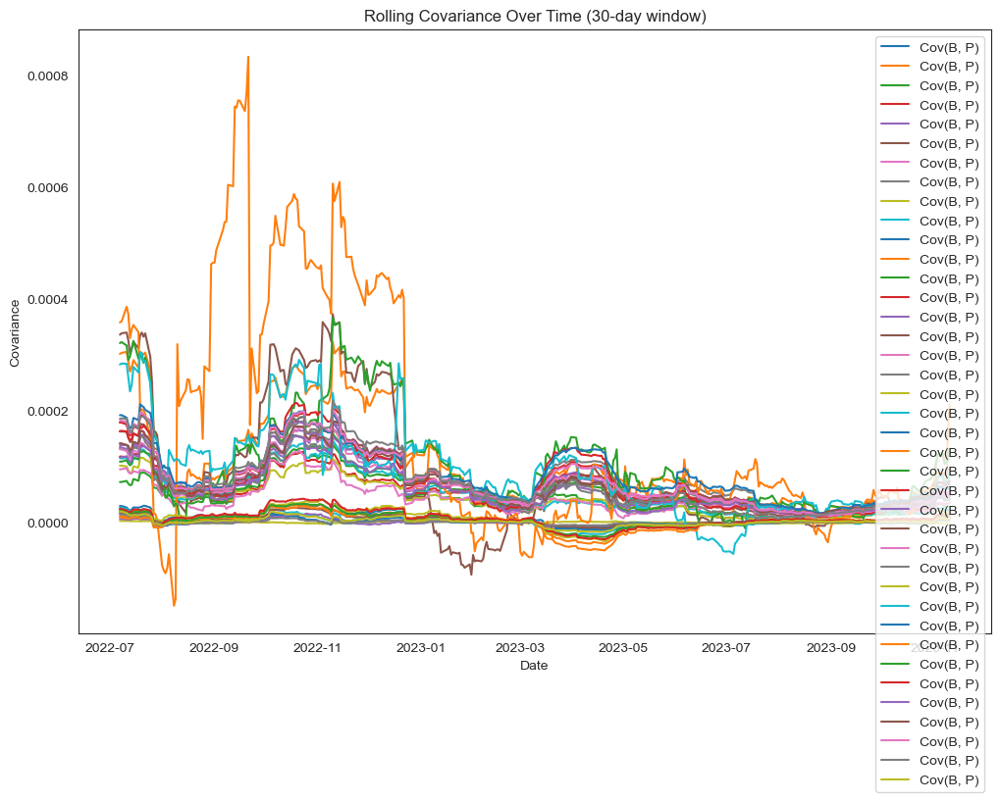

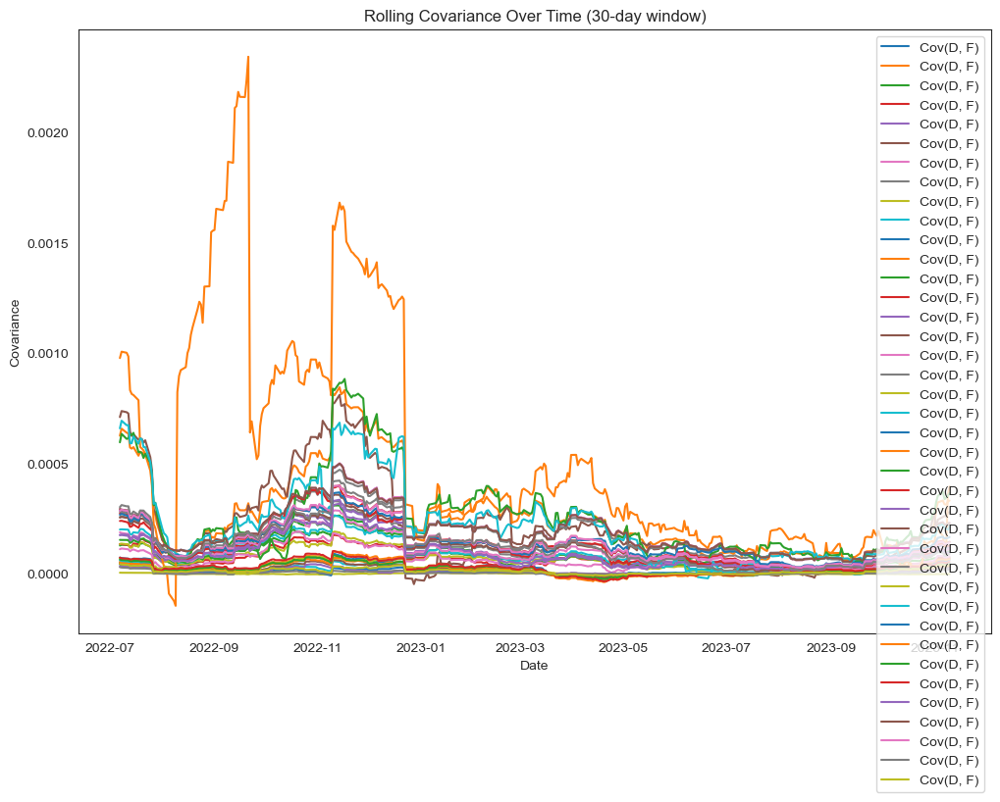

...

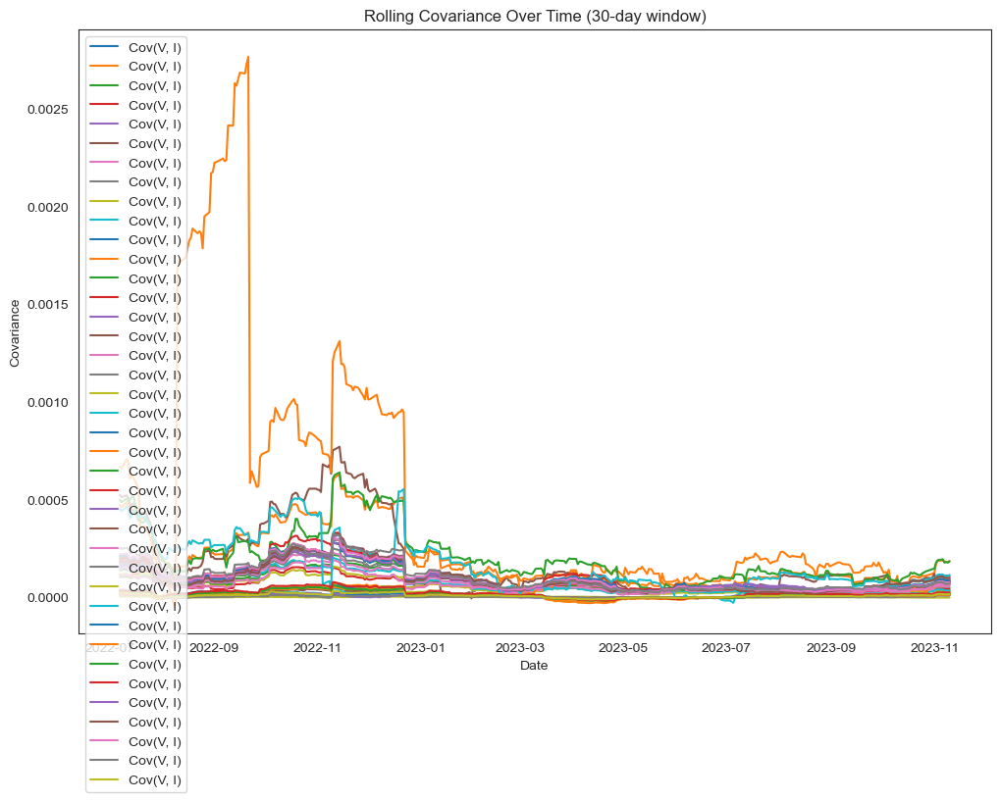

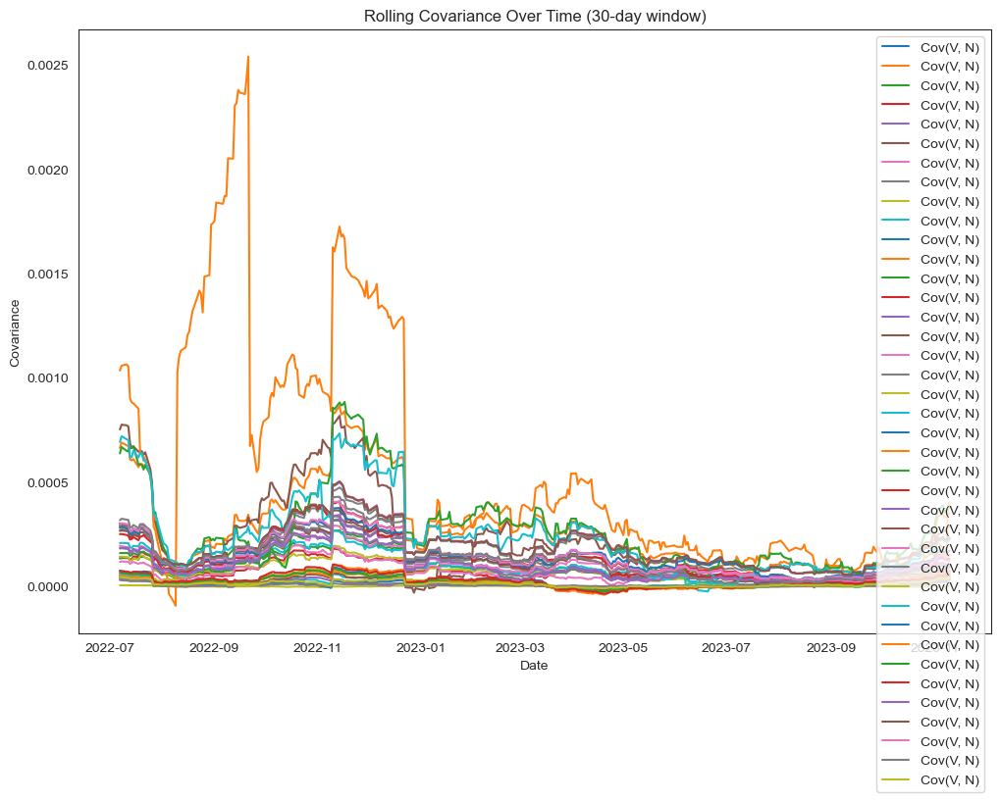

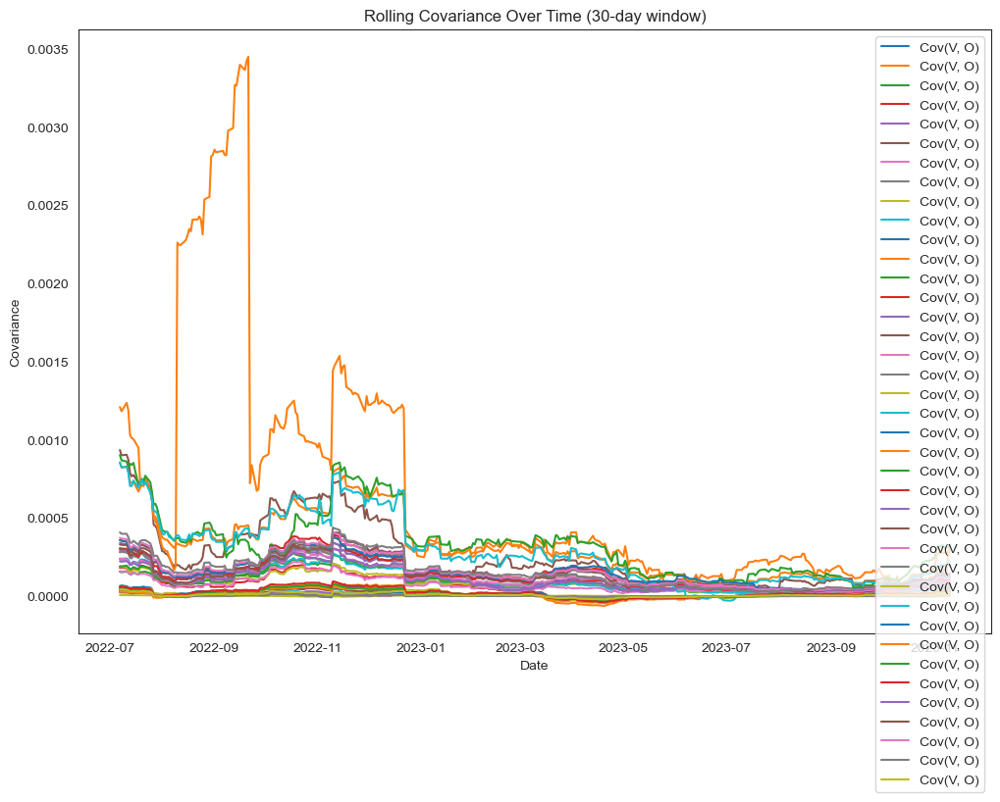

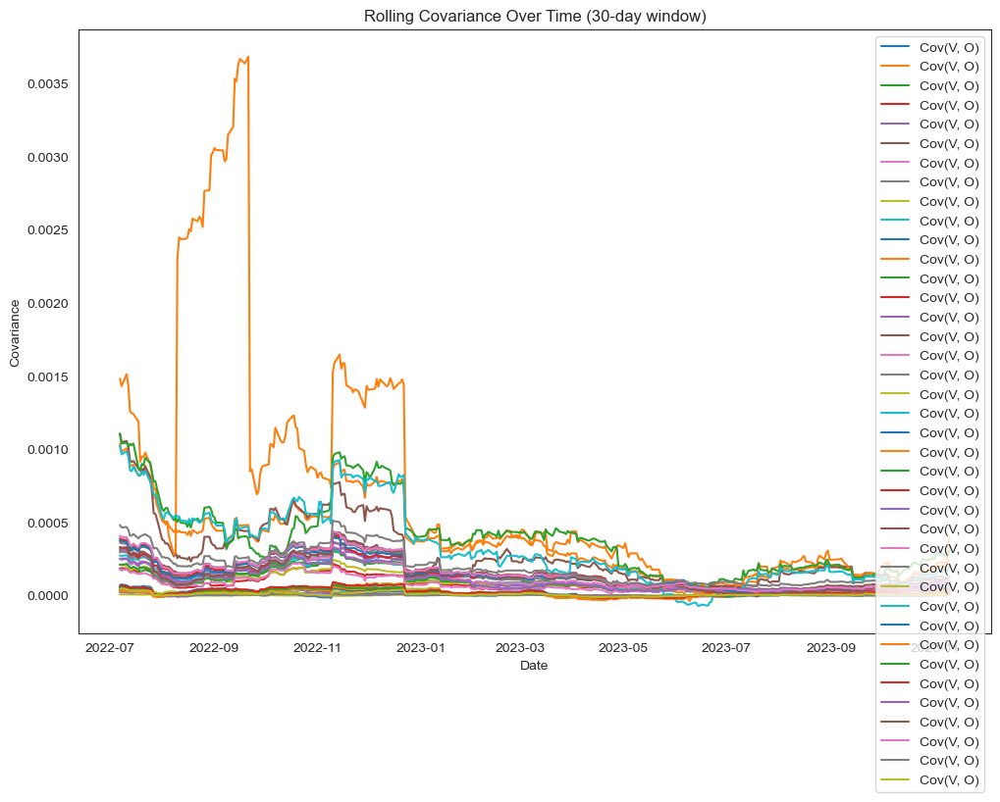

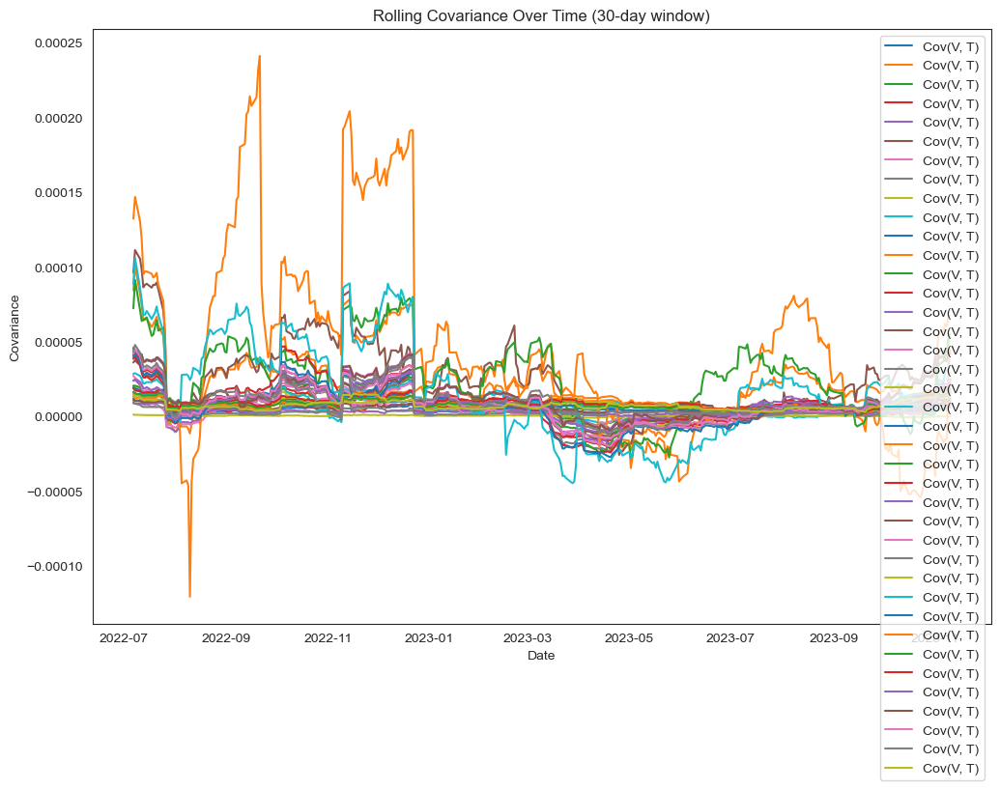

In [63]:
plot_rolling_covariance_multi(ticker_lst, rolling_window, start_date, end_date)